# Projet 3: prédiction des émissions de CO2

<B>Objectif</B>: on cherche à prédire la variable 'TotalGHGEmissions' ou sa transformation via la fonction logarithme 'ln_émissions' à l'aide des données structurelles des bâtiments, ainsi qu'à évaluer l'intérêt de l'"ENERGY STAR Score" pour faire ces prédictions.

Au cours de l'analyse exploratoire nous avons constitué deux jeux de données. Le premier, que nous noterons 'data', conserve la structure du jeu de donnée d'origine en ce qui concerne les variables indiquant l'usage des bâtiments. Dans le second, que nous noterons 'df', nous avons remplacé ces variables par d'autres, toutes numériques.

Nous effectuerons des prédictions sur ces deux jeux de données afin de voir si le feature engineering effectué sur les catégories de bâtiments améliore les prédictions. 

# Importation des éléments de travails

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn import dummy
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNet
from sklearn import kernel_ridge
import xgboost as xgb
import timeit

C:\Users\tony.mathieux\anaconda3\envs\machine_learning\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
data = pd.read_csv("data_pour_ML.csv") # fichier avec les variables LargestPropertyUseType, SecondLargestPropertyUseType ...
pd.set_option("display.max_columns", 50)
data.head()

,OSEBuildingID,PrimaryPropertyType,PropertyName,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),TotalGHGEmissions,distance_from_City_Hall,proportion_elec,ln_consommation,ln_emissions
0,1,lodging,Mayflower park hotel,7,1927.0,1.0,12.0,0.0,88434.0,lodging,88434.0,aucun,0.0,aucun,0.0,60.0,7226362.5,249.98,1.110872,0.87,15.793246,5.525373
1,2,lodging,Paramount Hotel,7,1996.0,1.0,11.0,15064.0,88502.0,lodging,83880.0,non refrigerated warehouse,15064.0,restauration,4622.0,61.0,8387933.0,295.86,1.081613,0.37,15.942305,5.693261
2,5,lodging,HOTEL MAX,7,1926.0,1.0,10.0,0.0,61320.0,lodging,61320.0,aucun,0.0,aucun,0.0,56.0,6794584.0,286.43,1.250795,0.62,15.731637,5.660979
3,8,lodging,WARWICK SEATTLE HOTEL (ID8),7,1980.0,1.0,18.0,62000.0,113580.0,lodging,123445.0,non refrigerated warehouse,68009.0,other,0.0,75.0,14172606.0,505.01,1.358169,0.37,16.466822,6.226556
4,9,other,West Precinct,7,1999.0,1.0,2.0,37198.0,60090.0,office,88830.0,aucun,0.0,aucun,0.0,NaN,12086616.0,301.81,1.466682,0.62,16.307609,5.713106


In [3]:
df = pd.read_csv('data_ML_ameliore.csv') # fichier avec les variables de catégories de bâtiments leisure, mall, medical...
df.head()

,OSEBuildingID,PrimaryPropertyType,PropertyName,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,PropertyGFABuilding(s),ENERGYSTARScore,SiteEnergyUse(kBtu),TotalGHGEmissions,distance_from_City_Hall,proportion_elec,ln_consommation,ln_emissions,education,leisure,lodging,mall,medical,non refrigerated warehouse,office,other,refrigerated warehouse,restauration,services,store
0,1,lodging,Mayflower park hotel,7,1927.0,1.0,12.0,0.0,88434.0,60.0,7226362.5,249.98,1.110872,0.87,15.793246,5.525373,0.0,0.0,88434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,lodging,Paramount Hotel,7,1996.0,1.0,11.0,15064.0,88502.0,61.0,8387933.0,295.86,1.081613,0.37,15.942305,5.693261,0.0,0.0,83880.0,0.0,0.0,15064.0,0.0,0.0,0.0,4622.0,0.0,0.0
2,5,lodging,HOTEL MAX,7,1926.0,1.0,10.0,0.0,61320.0,56.0,6794584.0,286.43,1.250795,0.62,15.731637,5.660979,0.0,0.0,61320.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,8,lodging,WARWICK SEATTLE HOTEL (ID8),7,1980.0,1.0,18.0,62000.0,113580.0,75.0,14172606.0,505.01,1.358169,0.37,16.466822,6.226556,0.0,0.0,123445.0,0.0,0.0,68009.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9,other,West Precinct,7,1999.0,1.0,2.0,37198.0,60090.0,NaN,12086616.0,301.81,1.466682,0.62,16.307609,5.713106,0.0,0.0,0.0,0.0,0.0,0.0,88830.0,0.0,0.0,0.0,0.0,0.0


# Plan de l'étude

Pour tester la pertinence du feature engineering effectué sur les catégories de bâtiments et pour évaluer l'intérêts de l'ENERGY STAR Score, nous testerons des modèles de machine learning successivement sur:

<ul>
    <li>data, sans ENERGY STAR Score</li>
    <li>data, avec ENERGY STAR Score</li>
    <li>df, sans ENERGY STAR Score</li>
    <li>df, avec ENERGY STAR Score</li>
</ul>

Dans chaque cas nous testerons les modèles suivant (à moins qu'une bonne raison n'élimine le modèle):

<ul>
    <li>Random forest</li>
    <li>KRR à noyau linéaire</li>
    <li>KRR à noyau gaussien</li>
    <li>ElasticNet</li>
    <li>Gradient boosting</li>
    <li>Réseaux de neurones</li>
</ul>

On effectura une démarche similaire pour chaque modèle, hormis les réseaux de neurones car ceux-ci s'intégrerons mal à la fonction test_model ci-dessous destinée à automatiser les tests.

In [4]:
# Afin d'avoir des résultats reproductibles et d'entraîner les différents modèle sur les même données d'entraînement on définit
# les contantes suivantes
rand_init = 3 # random_state de la fonction train_test_split
cv = 5 # paramètre cv de GridSearchCV

In [5]:
def test_model(X, Y, test_size, rand_init, num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, graph, print_option=True):
    '''
    Renvoie le modèle 'model' entraîné, le temps d'entraînement, le r2_score sur le jeu de test et la 'mean absolute error',
    sur le jeu de test.
    
    Paramètres
    ----------
    X : le jeu de données
    Y : la variable à prédire
    test_size : le paramètre test_size de la fonction train_test_split
    rand_init : le paramètre random_state de la fonction train_test_split
    num_encoder: un encoder pour les variables numériques
    var_num_encoder : les variables de X à encoder avec num_encoder
    categ_encoder: un encoder pour les variables catégorielles
    var_categ_encoder : les variables de X à encoder avec categ_encoder
    model : le modèle à tester
    graph : booléen, si True alors la fonction test_model tracera le graph des valeurs prédites par le modèle sur le jeu de test
        ainsi que les valeurs réels
    print_option : booléen, True par défaut, écrit le temps d'entraînement, le r2_score sur le jeu de test et
        la 'mean absolute error', sur le jeu de test 
    '''
    start_time = timeit.default_timer()
    X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=test_size, random_state=rand_init)
    ct = make_column_transformer((num_encoder, var_num_encoder),(categ_encoder, var_categ_encoder))
    ct.fit(X_train)
    X_train_encoder = ct.transform(X_train)
    model.fit(X_train_encoder, Y_train)
    temps = timeit.default_timer() - start_time
    
    y_pred = model.predict(ct.transform(X_test))
    R2 = metrics.r2_score(Y_test, y_pred)
    mae = metrics.mean_absolute_error(Y_test, y_pred)
    if print_option == True:
        print("Temps d'entrainement: {}".format(temps))
        print( "R2 score : {}".format(R2))
        print( "mae : {}".format(mae))
    if graph == True:
        plt.figure(figsize=(16,8))
        plt.plot(range(0,len(Y_test)),y_pred[:], color='blue', label='prédiction')
        plt.plot(range(0,len(Y_test)),Y_test[:], color='orange', label='réel')
        plt.legend(loc="upper right")
    return [model, temps, R2, mae]

In [6]:
# Création d'un tableau pour stocker les résultats (temps d'exécution, r2_score et mae) des différents modèles
# Un modèle par ligne, mais deux prédiction: 'SiteEnergyUse(kBtu)' et 'ln_consommation'
noms_col = ['modèle','temps d\'éxécution', 'R2_score', 'mae','temps d\'éxécution ln', 'R2_score ln', 'mae ln']
mes_modeles = pd.DataFrame(columns = noms_col)

In [7]:
def add_line_to_modeles(df, liste1, nom_col_1, liste2):
    """
    Ajoute au dataframe df une nouvelle ligne formée à partir des listes liste1 et liste2
    
    Paramètres
    ----------
    df : il s'agira du dataframe 'mes_modeles'
    liste1 : fonction test_model pour une prédiction de 'SiteEnergyUse(kBtu)'
    liste2 : fonction test_model pour une prédiction de 'ln_consommation'
    nom_col_1 : nom du modèle
    """
    L1 = liste1.copy()
    L2 = liste2.copy()
    L1[0] = nom_col_1
    del L2[0]
    df.loc[len(df.index)] = L1 + L2

En général, un test se déroulera de la manière suivante:
<ol>
    <li>Initialisation d'une grille d'hyperparamètre si le test comporte une validation croisée via la fonction 'GridSearchCV'.</li>
    <li>Initialisation du modèle.</li>
    <li>Appel de la fonction test_model pour prédire 'TotalGHGEmissions'.</li>
    <li>Appel de la fonction test_model pour prédire 'ln_emissions'.</li>
    <li>Appel de la fonction add_line_to_modeles pour compléter le tableau récapitulatif des tests.</li>
</ol>

De plus, à la suite d'un test avec 'GridSearchCV' on fera un test avec des hyperparamètres testés dans le 'GridSearchCV' qui n'étaient pas optimaux afin de voir la différence.

Enfin on regardera la feature importance quand nous testerons les modèles sur le jeu de donnée df, mais pas avec data à cause du 'one_hot_encoding' qui pose problème.

# Données: data sans EnergyStarScore

In [8]:
Y = data['TotalGHGEmissions']
Y_ln = data['ln_emissions']
X = data[['PrimaryPropertyType', 'CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'PropertyGFABuilding(s)','proportion_elec',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA','SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA','distance_from_City_Hall']]

In [9]:
# Préprocessing des données

num_encoder = StandardScaler()

var_num_encoder = ['CouncilDistrictCode','YearBuilt','NumberofBuildings','NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA','SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseTypeGFA','proportion_elec','distance_from_City_Hall']

categ_encoder = OneHotEncoder(handle_unknown='ignore')

var_categ_encoder = ['PrimaryPropertyType', 'LargestPropertyUseType', 'SecondLargestPropertyUseType','ThirdLargestPropertyUseType']

Dans cette partie (data sans ENERGY STAR Score) nous allons commencer par tester deux méthodes de prédiction naïves (par la moyenne et par la médiane) afin d'avoir une base de comparaison pour les autres modèles. Nous ne referons pas ça dans les autres parties.

## Dummy regressor

In [10]:
# Initialisation du modèle
dum_mean = dummy.DummyRegressor(strategy='mean')

# Test du modèle pour prédire 'TotalGHGEmissions'
dum_mean_test = test_model(X, Y, 0.2, rand_init, 
                           num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, dum_mean, False, True)
# Dans ce cas il est inutile de tracer le graph des valeurs prédites/valeurs réels puisqu'on sait que dum_mean va donner une 
# droite horizontal

Temps d'entrainement: 0.008493299999999593
R2 score : -0.013784952323224742
mae : 63.04125503262529


In [11]:
# Test du modèle pour prédire 'ln_emissions'
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, dum_mean, False, False)

# On ajoute une ligne au tableau récapitulatif des tests
add_line_to_modeles(mes_modeles, dum_mean_test, 'dummy_mean', model_ln)

In [12]:
dum_median = dummy.DummyRegressor(strategy='median')

dum_median_test = test_model(X, Y, 0.2, rand_init, 
                             num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, dum_median, False, True)

Temps d'entrainement: 0.008209700000000097
R2 score : -0.09446503125086037
mae : 52.983401360544214


In [13]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, dum_median, False, False)
add_line_to_modeles(mes_modeles, dum_median_test, 'dummy_median', model_ln)

## Random forest

In [14]:
# grille d'hyperparamètres
param_grid = {'n_estimators': [100,200,300,400,500]}

# initialiser la validation croisée
grid_pred = GridSearchCV(
        RandomForestRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 65.87983089999999
R2 score : 0.4889965747625761
mae : 36.51098741496599


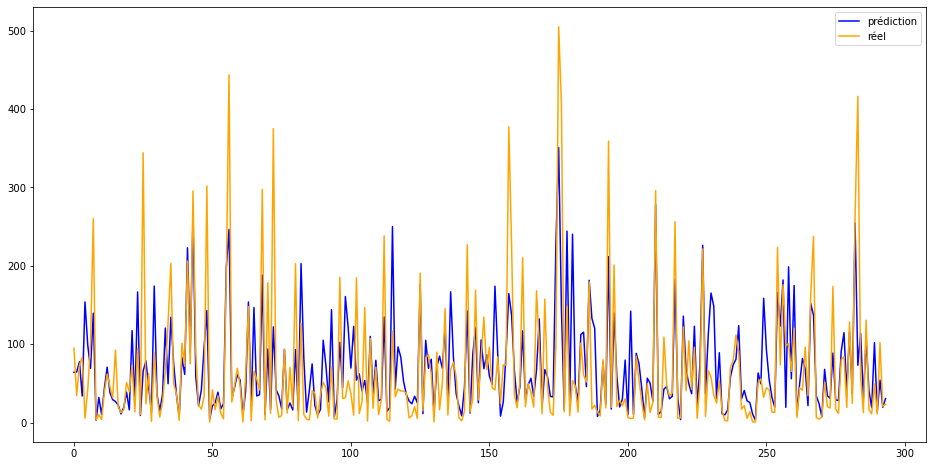

In [15]:
# Test du modèle pour prédire 'TotalGHGEmissions'
model_forest_grid = test_model(X, Y, 0.2, rand_init, 
                               num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [16]:
# Test du modèle pour prédire 'ln_emission'
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False)

# On ajoute une ligne au tableau récapitulatif des tests
add_line_to_modeles(mes_modeles, model_forest_grid, 'model_forest_grid',model_ln)

Temps d'entrainement: 64.3675465
R2 score : 0.641897658256119
mae : 0.561515072675635


Le modèle est bien meilleur pour prédire le logarithme des émissions que directement les émissions.

In [17]:
model_forest_grid[0].best_params_ # Indique le meilleur hyperparamètre

{'n_estimators': 300}

Regardons ce que donne un hyperparamètre 'n_estimators' égal à 200.

Temps d'entrainement: 2.444723600000003
R2 score : 0.5057628111792922
mae : 35.831550680272116


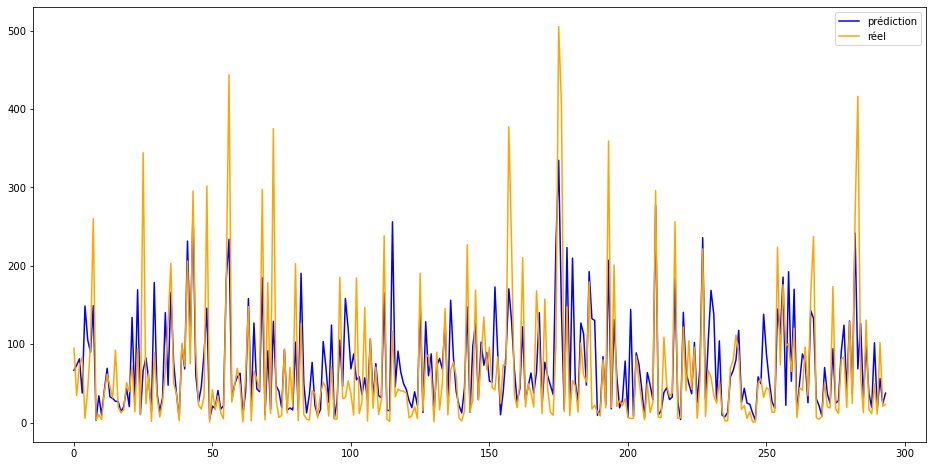

In [18]:
model_forest = RandomForestRegressor(n_estimators=200) 

model_forest_test = test_model(X, Y, 0.2, rand_init, 
                          num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model_forest, True)

Le r2_score entre model_forest_grid et model_forest_test diffère de moins de un centième. En fait, lors de la préparation de ce notebook, d'autre tests on été effectués et changer de 'n_estimators' ne modifie quasiment pas les prédictions.

In [19]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model_forest, False)
add_line_to_modeles(mes_modeles, model_forest_test, 'model_forest', model_ln)

Temps d'entrainement: 2.2472152999999935
R2 score : 0.6402127610113353
mae : 0.5642974673015375


Regardons l'influence du jeu d'entraînement sur l'efficacité du modèle. Pour cela on va simplement tester différentes valeur de 'random_state' lors du 'train_test_split'.

In [20]:
model = RandomForestRegressor(n_estimators=200)
for i in [1,7,13,16,21]:    
    L = test_model(X, Y, 0.2, i, num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, False, False)
    print("random_state =",i)
    print('R2 score : ', L[2])

random_state = 1
R2 score :  0.4810504102864177
random_state = 7
R2 score :  0.4793489328996471
random_state = 13
R2 score :  0.5899306527201216
random_state = 16
R2 score :  0.5091929578692824
random_state = 21
R2 score :  0.5305855111104174


Les variations sont importantes, jusqu'à un dizième d'écart soit bien plus que ce qui à été observé pour un changement de 'n_estimators'. Les données d'entraînement ont donc un fort impact sur la qualité du modèle.

## Kernel Ridge Regression

Nous testerons deux noyaux différents: un noyau linéaire, et un noyau gaussien.

### Noyau linéaire

In [21]:
# grille d'hyperparamètres
alpha_range = np.logspace(-2, 2, 5)


gamma_range = np.logspace(-2, 1, 4)


param_grid = {'alpha': alpha_range, 'gamma': gamma_range}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        kernel_ridge.KernelRidge(kernel='linear'),
        param_grid,
        cv=cv)

Temps d'entrainement: 2.703024499999998
R2 score : 0.3526849952238048
mae : 46.298479537037515


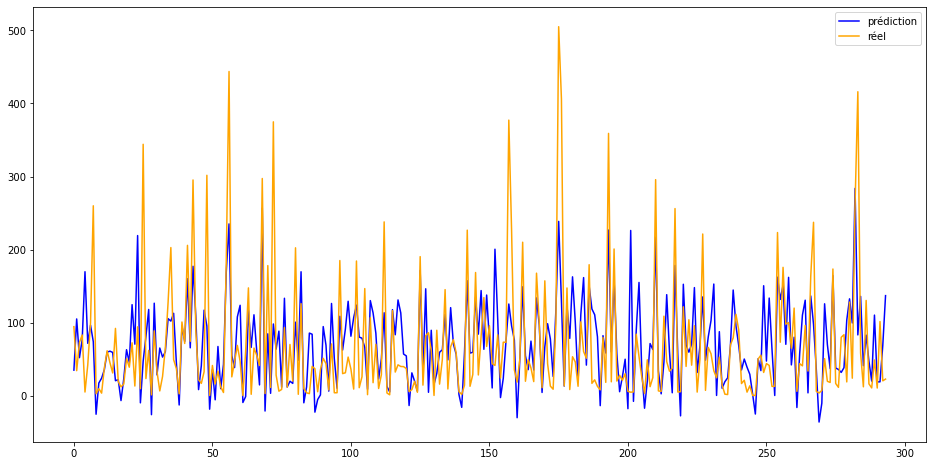

In [22]:
model_krr_lin_grid = test_model(X, Y, 0.2, rand_init, 
                                num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [23]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False)
add_line_to_modeles(mes_modeles, model_krr_lin_grid, 'model_krr_lin_grid', model_ln)

Temps d'entrainement: 2.61774410000001
R2 score : 0.5089215945900274
mae : 0.6707671950337798


In [24]:
model_krr_lin_grid[0].best_params_

{'alpha': 1.0, 'gamma': 0.01}

Temps d'entrainement: 0.043792700000011564
R2 score : 0.3264982949031281
mae : 47.12587266875463


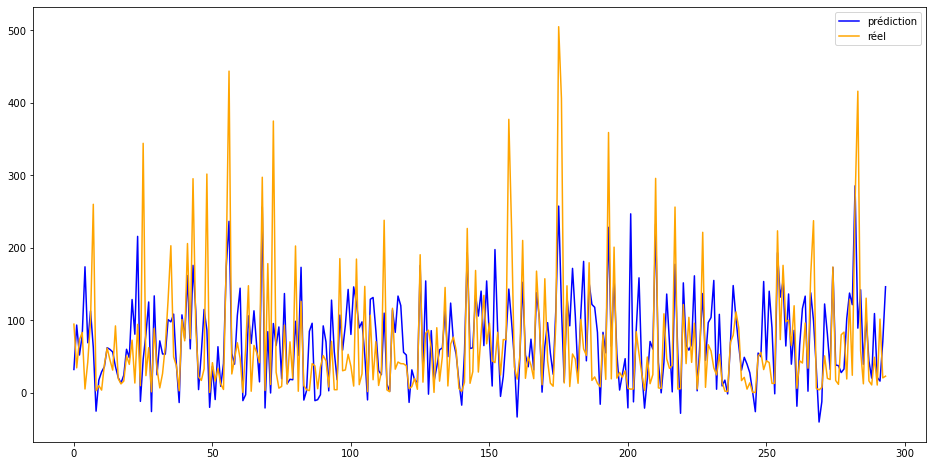

In [25]:
model = kernel_ridge.KernelRidge(alpha=1.0, kernel='linear', gamma=0.1)

model_krr_lin = test_model(X, Y, 0.2, rand_init, num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, True)

Pour ce modèle, le changement d'hyperparamètres à eu un impact un peu plus fort que pour les forêts aléatoires.

In [26]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, False, False)
add_line_to_modeles(mes_modeles, model_krr_lin, 'model_krr_lin', model_ln)

### Noyau Gaussien

Temps d'entrainement: 3.4453155999999865
R2 score : 0.46551355859842924
mae : 41.345932718478174


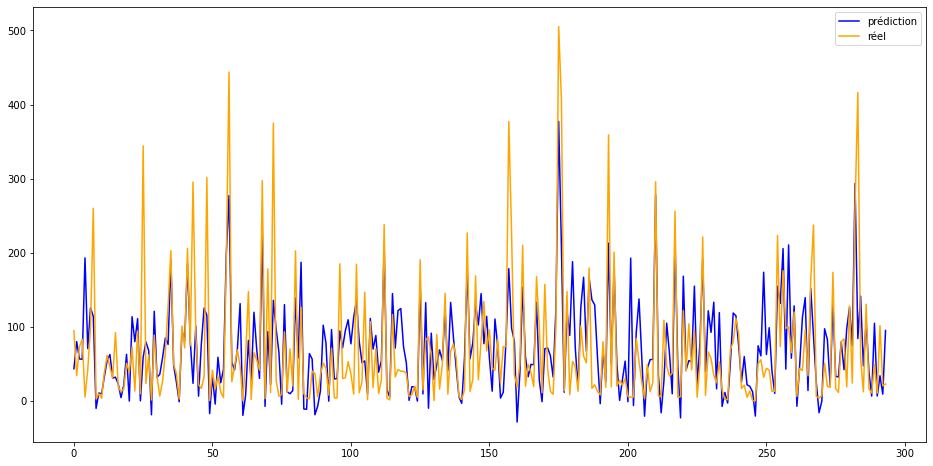

In [27]:
grid_pred = GridSearchCV(
        kernel_ridge.KernelRidge(kernel='rbf'),
        param_grid,
        cv=cv)
model_krr_rbf_grid = test_model(X, Y, 0.2, rand_init, 
                           num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [28]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False)
add_line_to_modeles(mes_modeles, model_krr_rbf_grid, 'model_krr_rbf_grid', model_ln)

Temps d'entrainement: 3.4352871000000107
R2 score : 0.5628428186772851
mae : 0.6130340986711262


In [29]:
model_krr_rbf_grid[0].best_params_

{'alpha': 0.1, 'gamma': 0.01}

Temps d'entrainement: 0.05024480000000153
R2 score : 0.2817361445063842
mae : 43.80040433006903


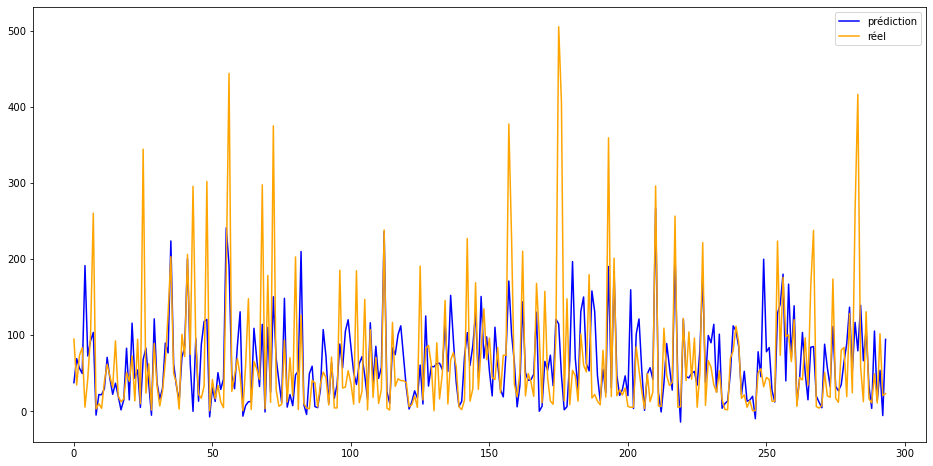

In [30]:
model = kernel_ridge.KernelRidge(alpha=1.0, kernel='rbf', gamma=0.1)

model_krr_rbf = test_model(X, Y, 0.2, rand_init, num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, True)

Cette fois-ci, des hyperparamètres non optimaux ont considérablement diminués la qualités des prédictions.

In [31]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, False, False)
add_line_to_modeles(mes_modeles, model_krr_rbf, 'model_krr_rbf', model_ln)

Regardons l'influence du jeu d'entraînement sur l'efficacité du modèle.

In [32]:
model = kernel_ridge.KernelRidge(alpha=0.01, kernel='rbf', gamma=0.01)
for i in [1,7,13,16,21]:    
    L = test_model(X, Y, 0.2, i, num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, False, False)
    print("random_state =",i)
    print('R2 score : ', L[2])

random_state = 1
R2 score :  0.5031920733895816
random_state = 7
R2 score :  0.46758995525959657
random_state = 13
R2 score :  0.6295460678930169
random_state = 16
R2 score :  0.511425936641619
random_state = 21
R2 score :  0.45524575233500175


Pour ce modèle aussi, on constate une forte dépendance au jeu d'entraînement. On ne fera pas ce test pour les autres modèles.

A partir de maintenant il y aura moins de commentaires sur les tests effectués, on analysera les résultats à la fin du notebook à l'aide du tableau récapitulatif. 

## ElasticNet

In [33]:
# grille d'hyperparamètres
param_grid = {'alpha': [0.01, 0.1, 1], 'l1_ratio' : [0.25, 0.5, 0.75], 'random_state': [0, 5, 10, 20]}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        ElasticNet(),
        param_grid,
        cv=cv)

Temps d'entrainement: 1.0266913000000102
R2 score : 0.34855722472014283
mae : 46.878328633891435


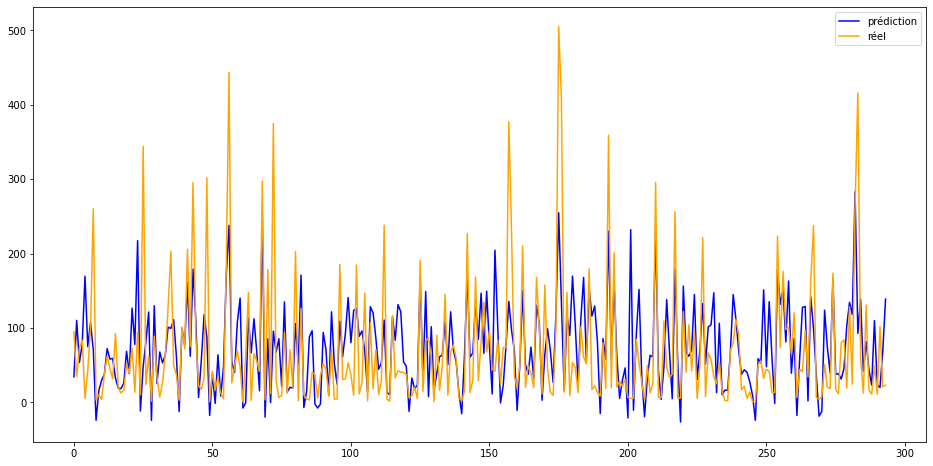

In [34]:
model_elasticnet_grid = test_model(X, Y, 0.2, rand_init, 
                                   num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [35]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False)
add_line_to_modeles(mes_modeles, model_elasticnet_grid, 'model_elasticnet_grid', model_ln)

Temps d'entrainement: 0.5764341999999942
R2 score : 0.5098070704623852
mae : 0.6697352744493428


In [36]:
model_elasticnet_grid[0].best_params_

{'alpha': 0.01, 'l1_ratio': 0.25, 'random_state': 0}

Temps d'entrainement: 0.009709800000024416
R2 score : 0.37833722959915317
mae : 47.484044424951804


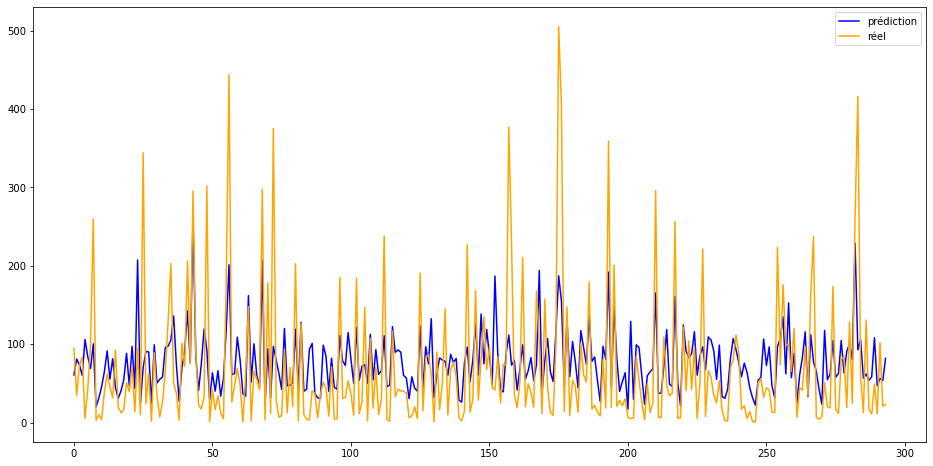

In [37]:
model = ElasticNet(alpha=1, l1_ratio=0.5, random_state=7)

model_elasticnet = test_model(X, Y, 0.2, rand_init, 
                               num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, True)

In [38]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, False, False)
add_line_to_modeles(mes_modeles, model_elasticnet, 'model_elasticnet', model_ln)

## Gradient boosting

En ce qui concerne la méthode de Gradient boosting, des tests préliminaires ont montrés que le modèle de la bibliothèque xgboost donnait de meilleurs résultats que celui de scikit-learn, donc nous utiliserons xgboost. 

In [39]:
n_estimators_range = [100, 200, 300, 400, 500]

reg_lambda_range = [1, 2]

gamma_range = [0, 1]

max_depth_range = [1, 2, 3, 4]

# grille d'hyperparamètres
param_grid = {'n_estimators': n_estimators_range, 'reg_lambda': reg_lambda_range, 'gamma': gamma_range, 'max_depth': max_depth_range}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        xgb.XGBRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 29.842962400000005
R2 score : 0.48085211074395706
mae : 37.33165032050034


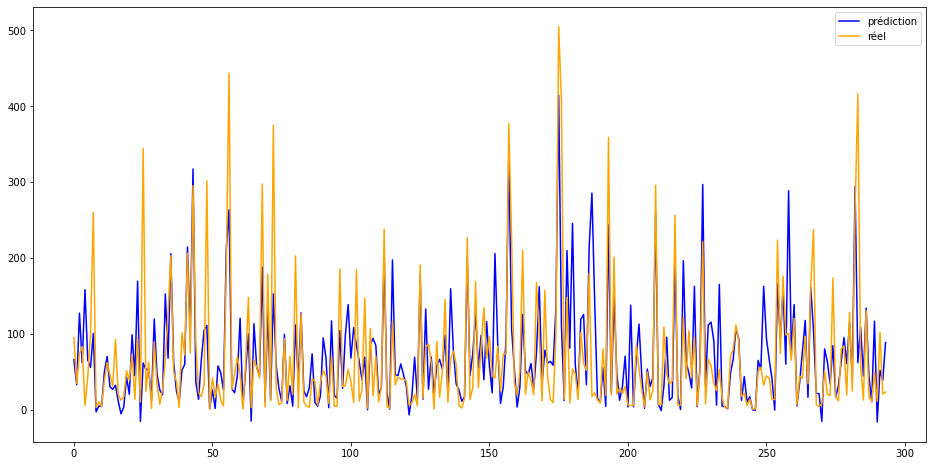

In [40]:
model_xgb_grid = test_model(X, Y, 0.2, rand_init, 
                            num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [41]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_xgb_grid, 'model_xgb_grid', model_ln)

In [42]:
model_xgb_grid[0].best_params_

{'gamma': 1, 'max_depth': 4, 'n_estimators': 100, 'reg_lambda': 2}

Temps d'entrainement: 0.07247040000001448
R2 score : 0.4547967771015319
mae : 39.15331313391526


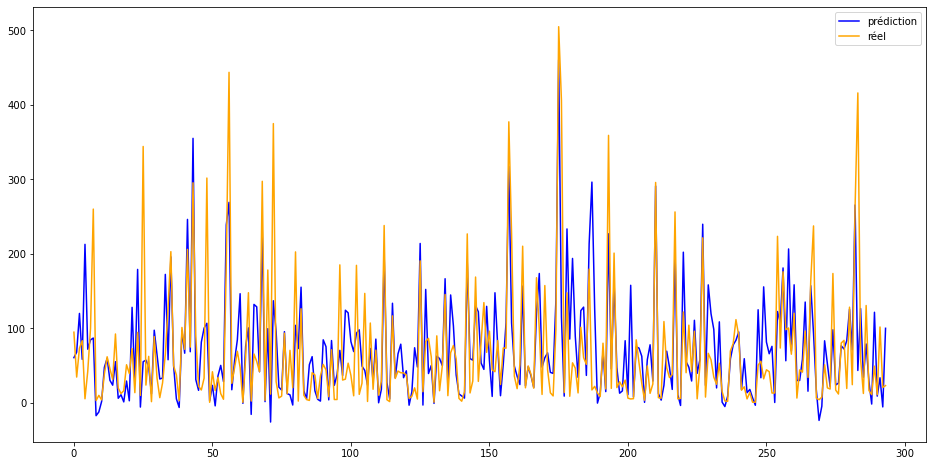

In [43]:
model = xgb.XGBRegressor(n_estimators=200, reg_lambda=1, gamma=0, max_depth=3)

model_xgb = test_model(X, Y, 0.2, rand_init, num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, True)

In [44]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, model, False, False)
add_line_to_modeles(mes_modeles, model_xgb, 'model_xgb', model_ln)

## Réseaux de neurones

Les réseaux de neurones seront implémentés à l'aide de la bibliothèque tensorflow.

Ces modèles s'intégraient mal à la fonction test_model, donc nous procéderons différemment. En particulier nous prédirons uniquement 'TotalGHGEmissions'.

In [45]:
import tensorflow as tf

In [46]:
# Création des jeux d'entrainement et de test
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.2, random_state=rand_init)

# Préprocessing des données
ct = make_column_transformer((num_encoder, var_num_encoder),(categ_encoder, var_categ_encoder))
ct.fit(X_train)
X_train_encoder = ct.transform(X_train)
Ytrain_tf = tf.convert_to_tensor(Y_train)

In [47]:
# Une fonction pour tester les modèles
def test_neuralnetwork_model(model, X_test, Y_test):
    y_pred = model.predict(ct.transform(X_test))
    R2 = metrics.r2_score(Y_test, y_pred)
    mae = metrics.mean_absolute_error(Y_test, y_pred)
    print( "R2 score : {}".format(R2))
    print( "mae : {}".format(mae))

On peut faire varier énormément de chose dans un réseau de neurones:
<ul>
    <li>Le nombre de couche.</li>
    <li>Le nombre de neurone par couche.</li>
    <li>La fonction d'activation à la fin de chaque couche.</li>
    <li>L'"optimizers", la métric et la fonction de perte.</li>
    <li>Le "learning_rate" de l'"optimizers".</li>
    <li>Le nombre "epochs".</li>
</ul>

Mais on ne peut pas recourir à la fonction GridSearchCV de la bibliothèque scikit-learn comme précédemment. Du coup, des dizaines de tests ont été effectués et seulement quelques un figure dans ce notebook. En particulier tous les tests présentés ici sont effectués avec l'"optimizers" Adam, car il semblerait que ce soit le meilleur, et comportent des fonctions d'activation linéaires ou "relu".

La métrique utilisée pour compiler sera 'mae' car il n'y a pas de 'r2_score'.

Le fait que nous ne fassions pas de validation croisée est problématique. Si les réseaux de neurones ne donnent pas des résultats clairement supérieurs aux autres modèles, alors nous ne les prendrons pas en compte pour le choix final.

In [48]:
# Création du modèle
model_1 = tf.keras.Sequential([tf.keras.layers.Dense(100),
                              tf.keras.layers.Dense(10),
                              tf.keras.layers.Dense(1)])
# Compilation
model_1.compile(loss='mae',
               optimizer=tf.keras.optimizers.Adam(),
               metrics='mae')
# Fit
model_1.fit(X_train_encoder,Ytrain_tf, epochs=100)

Epoch 1/100


C:\Users\tony.mathieux\anaconda3\envs\machine_learning\lib\site-packages\tensorflow\python\framework\indexed_slices.py:447: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/sequential/dense/embedding_lookup_sparse/Reshape_1:0", shape=(None,), dtype=int32), values=Tensor("gradient_tape/sequential/dense/embedding_lookup_sparse/Reshape:0", shape=(None, 100), dtype=float32), dense_shape=Tensor("gradient_tape/sequential/dense/embedding_lookup_sparse/Cast:0", shape=(2,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(


37/37 [==============================] - 1s 2ms/step - loss: 77.4678 - mae: 77.4678
Epoch 2/100
37/37 [==============================] - 0s 2ms/step - loss: 70.3753 - mae: 70.3753
Epoch 3/100
37/37 [==============================] - 0s 2ms/step - loss: 58.8308 - mae: 58.8308
Epoch 4/100
37/37 [==============================] - 0s 2ms/step - loss: 50.4489 - mae: 50.4489
Epoch 5/100
37/37 [==============================] - 0s 2ms/step - loss: 46.5320 - mae: 46.5320
Epoch 6/100
37/37 [==============================] - 0s 2ms/step - loss: 44.9251 - mae: 44.9251
Epoch 7/100
37/37 [==============================] - 0s 2ms/step - loss: 44.0725 - mae: 44.0725
Epoch 8/100
37/37 [==============================] - 0s 2ms/step - loss: 43.6606 - mae: 43.6606
Epoch 9/100
37/37 [==============================] - 0s 2ms/step - loss: 43.3563 - mae: 43.3563
Epoch 10/100
37/37 [==============================] - 0s 2ms/step - loss: 43.0534 - mae: 43.0534
Epoch 11/100
37/37 [==============================]

37/37 [==============================] - 0s 2ms/step - loss: 42.1125 - mae: 42.1125
Epoch 86/100
37/37 [==============================] - 0s 2ms/step - loss: 42.1189 - mae: 42.1189
Epoch 87/100
37/37 [==============================] - 0s 2ms/step - loss: 42.1444 - mae: 42.1444
Epoch 88/100
37/37 [==============================] - 0s 2ms/step - loss: 42.0706 - mae: 42.0706
Epoch 89/100
37/37 [==============================] - 0s 2ms/step - loss: 42.0755 - mae: 42.0755
Epoch 90/100
37/37 [==============================] - 0s 2ms/step - loss: 42.1490 - mae: 42.1490
Epoch 91/100
37/37 [==============================] - 0s 2ms/step - loss: 42.0849 - mae: 42.0849
Epoch 92/100
37/37 [==============================] - 0s 2ms/step - loss: 42.1149 - mae: 42.1149
Epoch 93/100
37/37 [==============================] - 0s 2ms/step - loss: 42.0452 - mae: 42.0452
Epoch 94/100
37/37 [==============================] - 0s 2ms/step - loss: 42.0695 - mae: 42.0695
Epoch 95/100
37/37 [=======================

In [49]:
test_neuralnetwork_model(model_1, X_test, Y_test)

R2 score : 0.3549837874002869
mae : 40.90915567974655


Pour rappel les forêt aléatoire avait obtenu un r2_score d'environ 0.5, donc ici c'est clairement moins bien.

Pour le test suivant, nous allons simplement changer le 'learning_rate', qui vaut 0.01 par défaut.

In [50]:
# Création du modèle
model_2 = tf.keras.Sequential([tf.keras.layers.Dense(100),
                              tf.keras.layers.Dense(10),
                              tf.keras.layers.Dense(1)])
# Compilation
model_2.compile(loss='mae',
               optimizer=tf.keras.optimizers.Adam(learning_rate=0.1),
               metrics='mae')
# Fit
model_2.fit(X_train_encoder,Ytrain_tf, epochs=100)

Epoch 1/100


C:\Users\tony.mathieux\anaconda3\envs\machine_learning\lib\site-packages\tensorflow\python\framework\indexed_slices.py:447: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/sequential_1/dense_3/embedding_lookup_sparse/Reshape_1:0", shape=(None,), dtype=int32), values=Tensor("gradient_tape/sequential_1/dense_3/embedding_lookup_sparse/Reshape:0", shape=(None, 100), dtype=float32), dense_shape=Tensor("gradient_tape/sequential_1/dense_3/embedding_lookup_sparse/Cast:0", shape=(2,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(


37/37 [==============================] - 0s 2ms/step - loss: 51.5410 - mae: 51.5410
Epoch 2/100
37/37 [==============================] - 0s 1ms/step - loss: 45.9378 - mae: 45.9378
Epoch 3/100
37/37 [==============================] - 0s 2ms/step - loss: 44.5710 - mae: 44.5710
Epoch 4/100
37/37 [==============================] - 0s 2ms/step - loss: 45.5609 - mae: 45.5609
Epoch 5/100
37/37 [==============================] - 0s 2ms/step - loss: 44.9426 - mae: 44.9426
Epoch 6/100
37/37 [==============================] - 0s 2ms/step - loss: 47.1900 - mae: 47.1900
Epoch 7/100
37/37 [==============================] - 0s 2ms/step - loss: 44.9959 - mae: 44.9959
Epoch 8/100
37/37 [==============================] - 0s 2ms/step - loss: 45.6744 - mae: 45.6744
Epoch 9/100
37/37 [==============================] - 0s 2ms/step - loss: 45.6036 - mae: 45.6036
Epoch 10/100
37/37 [==============================] - 0s 2ms/step - loss: 44.9859 - mae: 44.9859
Epoch 11/100
37/37 [==============================]

37/37 [==============================] - 0s 2ms/step - loss: 45.0641 - mae: 45.0641
Epoch 86/100
37/37 [==============================] - 0s 2ms/step - loss: 45.6920 - mae: 45.6920
Epoch 87/100
37/37 [==============================] - 0s 2ms/step - loss: 44.3608 - mae: 44.3608
Epoch 88/100
37/37 [==============================] - 0s 2ms/step - loss: 44.8950 - mae: 44.8950
Epoch 89/100
37/37 [==============================] - 0s 2ms/step - loss: 43.8365 - mae: 43.8365
Epoch 90/100
37/37 [==============================] - 0s 2ms/step - loss: 44.6460 - mae: 44.6460
Epoch 91/100
37/37 [==============================] - 0s 2ms/step - loss: 45.8180 - mae: 45.8180
Epoch 92/100
37/37 [==============================] - 0s 2ms/step - loss: 44.9768 - mae: 44.9768
Epoch 93/100
37/37 [==============================] - 0s 2ms/step - loss: 44.2523 - mae: 44.2523
Epoch 94/100
37/37 [==============================] - 0s 2ms/step - loss: 44.3311 - mae: 44.3311
Epoch 95/100
37/37 [=======================

In [51]:
test_neuralnetwork_model(model_2, X_test, Y_test)

R2 score : 0.35214846939265976
mae : 41.87495280090644


Pas d'amélioration.

Revenons au learning_rate de 0.01, ajoutons des neurones à la deuxième couche et changeons de fonctions d'activation.

In [52]:
# Création du modèle
model_3 = tf.keras.Sequential([tf.keras.layers.Dense(100,activation='relu'),
                              tf.keras.layers.Dense(100,activation='relu'),
                              tf.keras.layers.Dense(1)])
# Compilation
model_3.compile(loss='mae',
               optimizer=tf.keras.optimizers.Adam(),
               metrics='mae')
# Fit
model_3.fit(X_train_encoder,Ytrain_tf, epochs=100)

Epoch 1/100


C:\Users\tony.mathieux\anaconda3\envs\machine_learning\lib\site-packages\tensorflow\python\framework\indexed_slices.py:447: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/sequential_2/dense_6/embedding_lookup_sparse/Reshape_1:0", shape=(None,), dtype=int32), values=Tensor("gradient_tape/sequential_2/dense_6/embedding_lookup_sparse/Reshape:0", shape=(None, 100), dtype=float32), dense_shape=Tensor("gradient_tape/sequential_2/dense_6/embedding_lookup_sparse/Cast:0", shape=(2,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(


37/37 [==============================] - 0s 2ms/step - loss: 75.5315 - mae: 75.5315
Epoch 2/100
37/37 [==============================] - 0s 2ms/step - loss: 62.4591 - mae: 62.4591
Epoch 3/100
37/37 [==============================] - 0s 2ms/step - loss: 52.0722 - mae: 52.0722
Epoch 4/100
37/37 [==============================] - 0s 2ms/step - loss: 47.3434 - mae: 47.3434
Epoch 5/100
37/37 [==============================] - 0s 2ms/step - loss: 44.6571 - mae: 44.6571
Epoch 6/100
37/37 [==============================] - 0s 2ms/step - loss: 43.2278 - mae: 43.2278
Epoch 7/100
37/37 [==============================] - 0s 2ms/step - loss: 42.2831 - mae: 42.2831
Epoch 8/100
37/37 [==============================] - 0s 2ms/step - loss: 41.5907 - mae: 41.5907
Epoch 9/100
37/37 [==============================] - 0s 2ms/step - loss: 41.1127 - mae: 41.1127
Epoch 10/100
37/37 [==============================] - 0s 2ms/step - loss: 40.7900 - mae: 40.7900
Epoch 11/100
37/37 [==============================]

37/37 [==============================] - 0s 2ms/step - loss: 27.5735 - mae: 27.5735
Epoch 86/100
37/37 [==============================] - 0s 2ms/step - loss: 27.4478 - mae: 27.4478
Epoch 87/100
37/37 [==============================] - 0s 2ms/step - loss: 27.5250 - mae: 27.5250
Epoch 88/100
37/37 [==============================] - 0s 2ms/step - loss: 27.0823 - mae: 27.0823
Epoch 89/100
37/37 [==============================] - 0s 2ms/step - loss: 27.0237 - mae: 27.0237
Epoch 90/100
37/37 [==============================] - 0s 2ms/step - loss: 26.9587 - mae: 26.9587
Epoch 91/100
37/37 [==============================] - 0s 2ms/step - loss: 27.0099 - mae: 27.0099
Epoch 92/100
37/37 [==============================] - 0s 2ms/step - loss: 26.7422 - mae: 26.7422
Epoch 93/100
37/37 [==============================] - 0s 2ms/step - loss: 26.5033 - mae: 26.5033
Epoch 94/100
37/37 [==============================] - 0s 2ms/step - loss: 26.4817 - mae: 26.4817
Epoch 95/100
37/37 [=======================

In [53]:
test_neuralnetwork_model(model_3, X_test, Y_test)

R2 score : 0.43458738220877835
mae : 38.03076956974001


C'est mieux que le modèle 1, mais la comparaison de la mae sur le jeu de test à celle de la 100ème époque sur le jeu d'entraînement suggère un problème d'overfitting.

Maintenant ajoutons une couche.

In [54]:
# Créations du modèle
model_4 = tf.keras.Sequential([tf.keras.layers.Dense(100,activation='relu'),
                              tf.keras.layers.Dense(100,activation='relu'),
                               tf.keras.layers.Dense(100,activation='relu'),
                              tf.keras.layers.Dense(1)])
# Compilation
model_4.compile(loss='mae',
               optimizer=tf.keras.optimizers.Adam(),
               metrics='mae')
# Fit
model_4.fit(X_train_encoder,Ytrain_tf, epochs=100)

Epoch 1/100


C:\Users\tony.mathieux\anaconda3\envs\machine_learning\lib\site-packages\tensorflow\python\framework\indexed_slices.py:447: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/sequential_3/dense_9/embedding_lookup_sparse/Reshape_1:0", shape=(None,), dtype=int32), values=Tensor("gradient_tape/sequential_3/dense_9/embedding_lookup_sparse/Reshape:0", shape=(None, 100), dtype=float32), dense_shape=Tensor("gradient_tape/sequential_3/dense_9/embedding_lookup_sparse/Cast:0", shape=(2,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(


37/37 [==============================] - 0s 2ms/step - loss: 73.7241 - mae: 73.7241
Epoch 2/100
37/37 [==============================] - 0s 2ms/step - loss: 53.5518 - mae: 53.5518
Epoch 3/100
37/37 [==============================] - 0s 2ms/step - loss: 46.9820 - mae: 46.9820
Epoch 4/100
37/37 [==============================] - 0s 2ms/step - loss: 43.7256 - mae: 43.7256
Epoch 5/100
37/37 [==============================] - 0s 2ms/step - loss: 42.3346 - mae: 42.3346
Epoch 6/100
37/37 [==============================] - 0s 2ms/step - loss: 41.2280 - mae: 41.2280
Epoch 7/100
37/37 [==============================] - 0s 2ms/step - loss: 40.6332 - mae: 40.6332
Epoch 8/100
37/37 [==============================] - 0s 2ms/step - loss: 39.9472 - mae: 39.9472
Epoch 9/100
37/37 [==============================] - 0s 2ms/step - loss: 39.1376 - mae: 39.1376
Epoch 10/100
37/37 [==============================] - 0s 2ms/step - loss: 38.2848 - mae: 38.2848
Epoch 11/100
37/37 [==============================]

37/37 [==============================] - 0s 2ms/step - loss: 16.3421 - mae: 16.3421
Epoch 86/100
37/37 [==============================] - 0s 2ms/step - loss: 16.6483 - mae: 16.6483
Epoch 87/100
37/37 [==============================] - 0s 2ms/step - loss: 16.2530 - mae: 16.2530
Epoch 88/100
37/37 [==============================] - 0s 2ms/step - loss: 16.1084 - mae: 16.1084
Epoch 89/100
37/37 [==============================] - 0s 2ms/step - loss: 15.7613 - mae: 15.7613
Epoch 90/100
37/37 [==============================] - 0s 2ms/step - loss: 16.4822 - mae: 16.4822
Epoch 91/100
37/37 [==============================] - 0s 2ms/step - loss: 15.7709 - mae: 15.7709
Epoch 92/100
37/37 [==============================] - 0s 2ms/step - loss: 15.6310 - mae: 15.6310
Epoch 93/100
37/37 [==============================] - 0s 2ms/step - loss: 15.1526 - mae: 15.1526
Epoch 94/100
37/37 [==============================] - 0s 2ms/step - loss: 15.5263 - mae: 15.5263
Epoch 95/100
37/37 [=======================

In [55]:
test_neuralnetwork_model(model_4, X_test, Y_test)

R2 score : 0.4256170591026823
mae : 38.290204042934235


Cette fois-ci il y a clairement un problème d'overfitting. Comme en plus nous n'avons pas effectué de validation croisée, nous excluons les réseaux de neurones des choix possibles et nous ne les testerons pas sur les autres jeux de données.

# Données: data avec ENERGY STAR Score

Attention, l'ENERGY Star Score n'a pas été mesuré pour tous les bâtiments du jeu de données.

In [56]:
X = data[['PrimaryPropertyType', 'CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'PropertyGFABuilding(s)','ENERGYSTARScore',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA','SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA','distance_from_City_Hall','proportion_elec']]

X = X.loc[~(X['ENERGYSTARScore'].isna())]
Y = data['TotalGHGEmissions'].loc[X.index]
Y_ln = data['ln_emissions'].loc[X.index]

In [57]:
# Préprocessing des données
num_encoder = StandardScaler()

var_num_encoder = ['CouncilDistrictCode','YearBuilt','NumberofBuildings','NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)','ENERGYSTARScore',
       'LargestPropertyUseTypeGFA','SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseTypeGFA','distance_from_City_Hall','proportion_elec']

categ_encoder = OneHotEncoder(handle_unknown='ignore')

var_categ_encoder = ['PrimaryPropertyType', 'LargestPropertyUseType', 'SecondLargestPropertyUseType','ThirdLargestPropertyUseType']

## Random forest

In [58]:
# grille d'hyperparamètres
param_grid = {'n_estimators': [100,200,300,400,500]}

# initialiser la validation croisée
grid_pred = GridSearchCV(
        RandomForestRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 38.87485559999999
R2 score : 0.5790171559447848
mae : 34.23125231958764


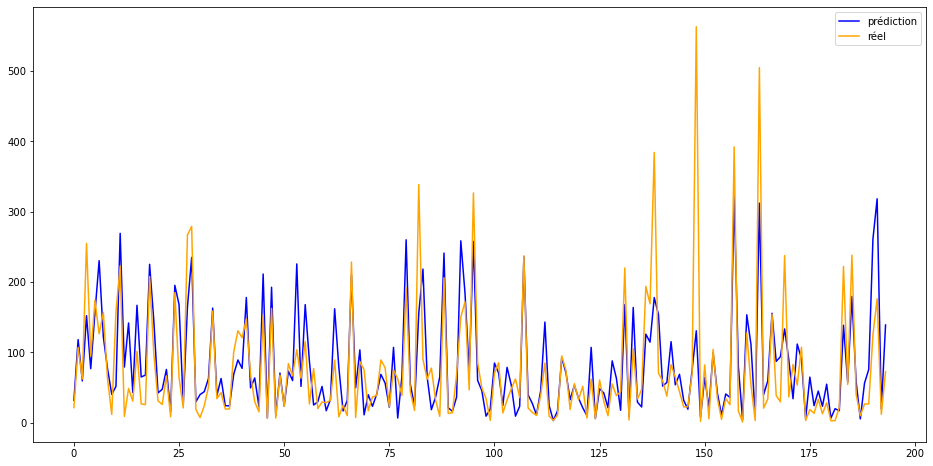

In [59]:
model_starscore_forest_grid = test_model(X, Y, 0.2, rand_init, 
                                         num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

On remarque que la prise en compte de l'ENERGY STAR Score à bien amélioré la qualité du modèle. 

In [60]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_starscore_forest_grid, 'model_starscore_forest_grid', model_ln)

## Kernel Ridge Regression

### Noyau linéaire

In [61]:
# grille d'hyperparamètres
alpha_range = np.logspace(-2, 2, 5)


gamma_range = np.logspace(-2, 1, 4)


param_grid = {'alpha': alpha_range, 'gamma': gamma_range}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        kernel_ridge.KernelRidge(kernel='linear'),
        param_grid,
        cv=cv)

Temps d'entrainement: 1.2447472999999718
R2 score : 0.4832703566946127
mae : 40.604913403098436


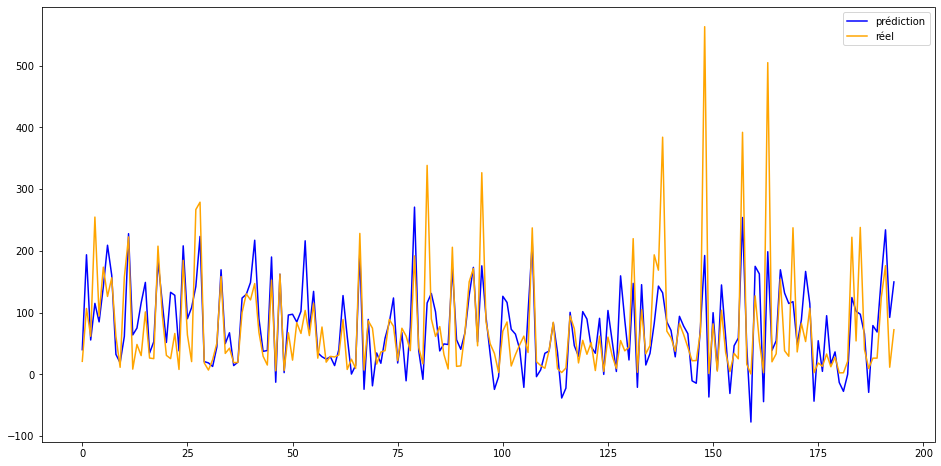

In [62]:
model_starscore_krr_lin_grid = test_model(X, Y, 0.2, rand_init, 
                                          num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [63]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_starscore_krr_lin_grid, 'model_starscore_krr_lin_grid', model_ln)

### Noyau Gaussien

Temps d'entrainement: 1.5775499000000082
R2 score : 0.6023470039737886
mae : 34.03466564251745


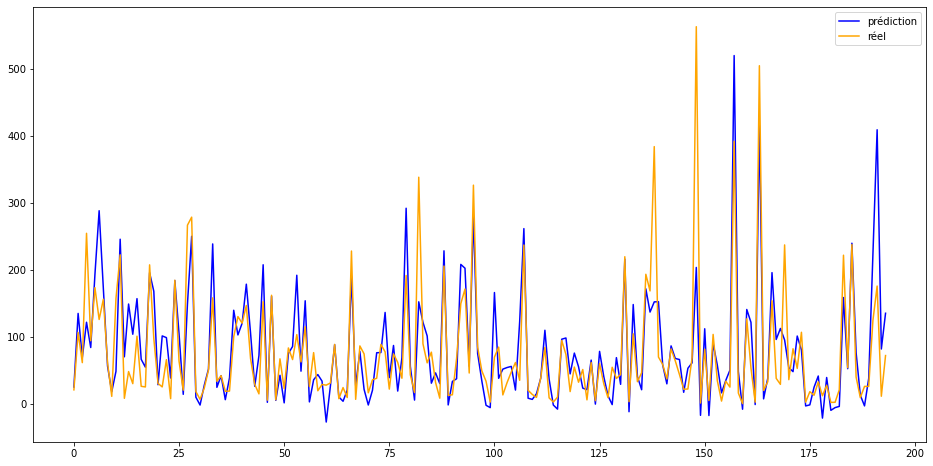

In [64]:
grid_pred = GridSearchCV(
        kernel_ridge.KernelRidge(kernel='rbf'),
        param_grid,
        cv=cv)
model_starscore_krr_rbf = test_model(X, Y, 0.2, rand_init, 
                                     num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [65]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_starscore_krr_rbf, 'model_starscore_krr_rbf_grid', model_ln)

## ElasticNet

In [66]:
# grille d'hyperparamètres
param_grid = {'alpha': [0.01, 0.1, 1], 'l1_ratio' : [0.25, 0.5, 0.75], 'random_state': [0, 5, 10, 20]}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        ElasticNet(),
        param_grid,
        cv=cv)

Temps d'entrainement: 0.8296894999999722
R2 score : 0.4859615588827443
mae : 40.50739755283004


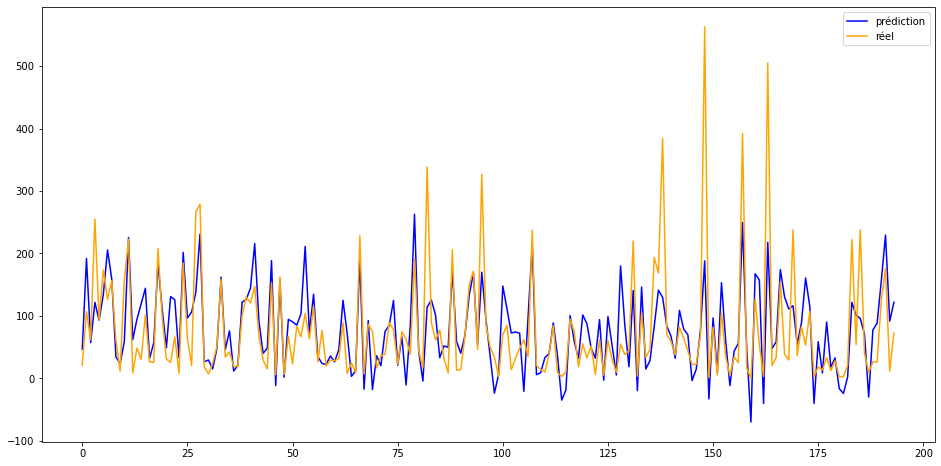

In [67]:
model_starscore_elasticnet_grid = test_model(X, Y, 0.2, rand_init, 
                                             num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [68]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_starscore_elasticnet_grid, 'model_starscore_elasticnet_grid', model_ln)

## Gradient boosting

In [69]:
n_estimators_range = [100, 200, 300, 400, 500]

reg_lambda_range = [1, 2]

gamma_range = [0, 1]

max_depth_range = [1, 2, 3, 4]

# grille d'hyperparamètres
param_grid = {'n_estimators': n_estimators_range, 'reg_lambda': reg_lambda_range, 'gamma': gamma_range, 'max_depth': max_depth_range}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        xgb.XGBRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 27.001663399999984
R2 score : 0.5815086626359184
mae : 32.026532282443696


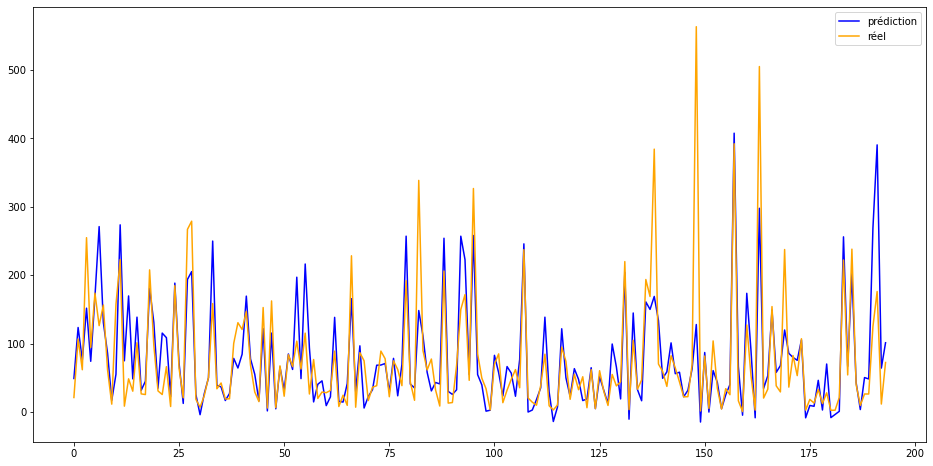

In [70]:
model_starscore_xgb_grid = test_model(X, Y, 0.2, rand_init, 
                                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [71]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_starscore_xgb_grid, 'model_starscore_xgb_grid', model_ln)

# Données: df sans ENERGY STAR Score

Passons maintenant à l'autre jeu de données. Nous ne testerons pas de réseaux de neurones mais nous ajoutons des mesures de la feature importance.

In [72]:
Y = df['TotalGHGEmissions']
Y_ln = df['ln_emissions']

X = df[['CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 
       'distance_from_City_Hall', 'education', 'leisure', 'lodging', 'mall',
       'medical', 'non refrigerated warehouse', 'office', 'other',
       'refrigerated warehouse', 'restauration', 'services', 'store','proportion_elec']]

In [73]:
# Préprocessing des données pour la fonction test_model
num_encoder = StandardScaler()

var_num_encoder = ['CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 
       'distance_from_City_Hall', 'education', 'leisure', 'lodging', 'mall',
       'medical', 'non refrigerated warehouse', 'office', 'other',
       'refrigerated warehouse', 'restauration', 'services', 'store','proportion_elec']

categ_encoder = OneHotEncoder(handle_unknown='ignore')

var_categ_encoder = []

Comme nous allons faire des mesures de feature importance, nous aurons besoin d'avoir accès aux données d'entraînement et de test.

In [74]:
X_train, X_test, Ytrain, Ytest = train_test_split(X,Y, test_size=0.2, random_state=3)

# Préprocessing des données pour la feature importance local
ct = make_column_transformer(
    (StandardScaler(),['CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 
       'distance_from_City_Hall', 'education', 'leisure', 'lodging', 'mall',
       'medical', 'non refrigerated warehouse', 'office', 'other',
       'refrigerated warehouse', 'restauration', 'services', 'store','proportion_elec']))

ct.fit(X_train)

X_train_scaled = ct.transform(X_train)
X_test_scaled = ct.transform(X_test)

La feature importance locale se mesure sur un individu. On regardera les deux suivants.

In [75]:
num_sample_a = 2
num_sample_b = 4
X_test.iloc[[num_sample_a,num_sample_b]]

,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,distance_from_City_Hall,education,leisure,lodging,mall,medical,non refrigerated warehouse,office,other,refrigerated warehouse,restauration,services,store,proportion_elec
799,3,1968.0,1.0,5.0,0.0,4.289025,40809.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.62
620,2,1953.0,1.0,1.0,0.0,4.352567,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,0.0,0.0,25000.0,0.37


Gardons en tête que le premier est de type 'education', et le deuxième de types 'store' et 'non refrigerated warehouse'.

## Random forest

In [76]:
# grille d'hyperparamètres
param_grid = {'n_estimators': [100,200,300,400,500]}

# initialiser la validation croisée
grid_pred = GridSearchCV(
        RandomForestRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 23.17444310000002
R2 score : 0.5090809556412423
mae : 34.810652380952384


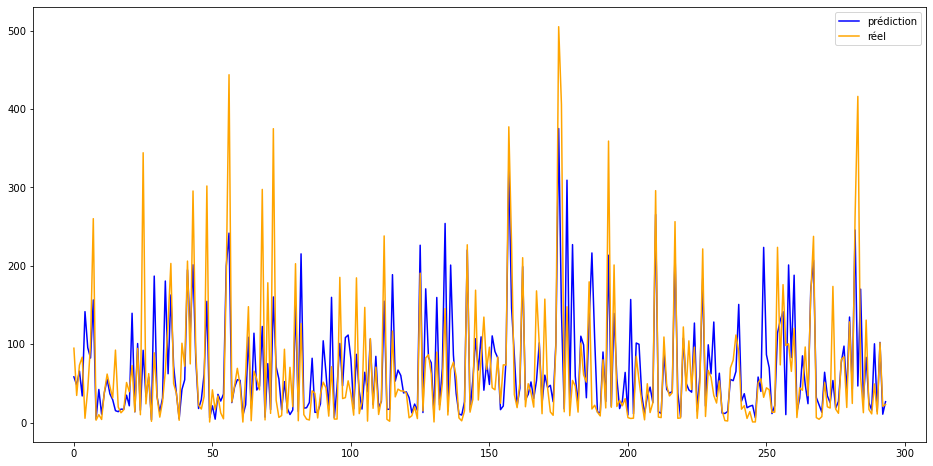

In [77]:
model_df_forest_grid = test_model(X, Y, 0.2, rand_init, 
                                         num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [78]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_forest_grid, 'model_df_forest_grid', model_ln)

### Feature importance

In [79]:
# On commence par créer un modèle de forêtes aléatoires
model = RandomForestRegressor(n_estimators=200)
model.fit(X_train_scaled, Ytrain)

RandomForestRegressor(n_estimators=200)

Commençons par regarder la feature importance global.

<AxesSubplot:>

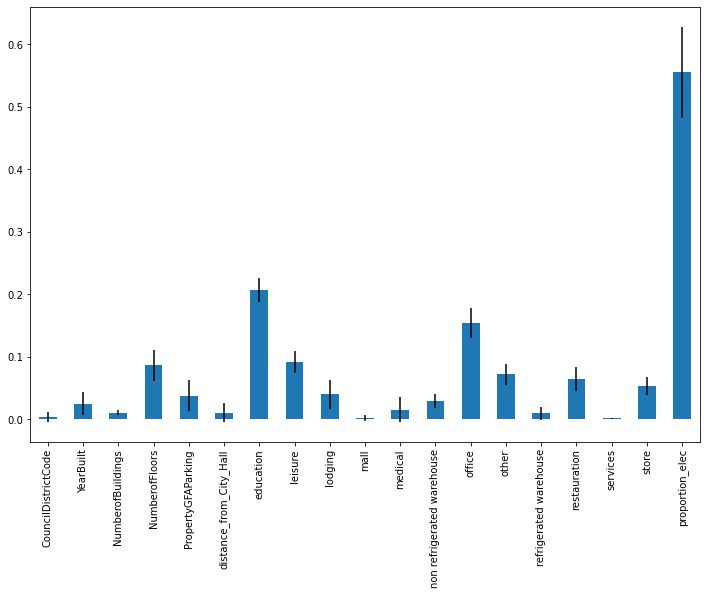

In [80]:
from sklearn.inspection import permutation_importance


result = permutation_importance(
    model, X_test_scaled, Ytest, n_repeats=10, random_state=42, n_jobs=2
)

forest_importances = pd.Series(result.importances_mean, index=X.columns)
plt.figure(figsize=(12,8))
forest_importances.plot.bar(yerr=result.importances_std)

Une différence notable avec la prédiction de la consommation est l'impact de 'proportion_elec'.

Passons maintenat à la feature importance locale. Dans la phase de recherche on a testé les modules shap et lime. Or la combinaison de shap et de xgboost à générée des erreurs et des warnings qui compliquaient l'automatisation des tests. Pour ce premier modèle nous utiliserons shap et lime, pour les comparer, mais par la suite nous n'utiliserons que lime.

In [81]:
import shap
import lime

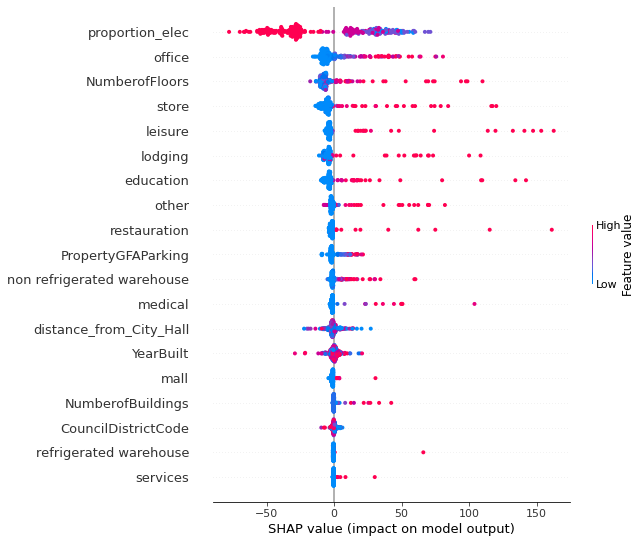

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

In [82]:
# Commençons avec shap
# On créer un 'TreeExplainer'
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test_scaled)

# On trace le résumer pour tous les bâtiments
shap.summary_plot(shap_values, X_test_scaled,feature_names=X.columns)
plt.figure(figsize=(8,8))

Ici aussi, comparé aux prédiction de consommation, on voit l'impact important de 'proportion_elec'.

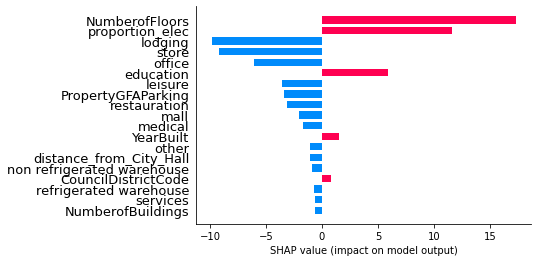

In [83]:
# Cette fois-ci on regarde un bâtiment en particulier, destiné à l'éducation
shap.bar_plot(explainer.shap_values(X_test_scaled[num_sample_a]),feature_names=X.columns, max_display=len(X.columns))

Analysons maintenant la feature importance de ce même bâtiment avec lime. On commence par créer une fonction pour faire cette analyse.

In [84]:
def lime_explanation(model, X_test_scaled, num_sample, num_features):
    lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_test_scaled, mode="regression")
    explanation = lime_explainer.explain_instance(X_test_scaled[num_sample], model.predict, num_features=num_features)
    explanation.show_in_notebook()

In [85]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

On remarque que lime n'a pas du tout capturer l'importance de proportion_elec' de la même manière que shap.

Regardons un autre bâtiment.

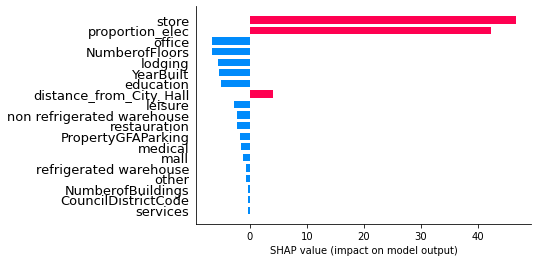

In [86]:
shap.bar_plot(explainer.shap_values(X_test_scaled[num_sample_b]),feature_names=X.columns, max_display=len(X.columns))

In [87]:
lime_explanation(model, X_test_scaled, num_sample_b, X.columns.shape[0])

Cette fois lime et shap on prit en compte de la même manière 'proportion_elec'.

## Kernel Ridge Regression

### Noyau linéaire

In [88]:
alpha_range = np.logspace(-2, 2, 5)


gamma_range = np.logspace(-2, 1, 4)

# grille d'hyperparamètres
param_grid = {'alpha': alpha_range, 'gamma': gamma_range}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        kernel_ridge.KernelRidge(kernel='linear'),
        param_grid,
        cv=cv)

Temps d'entrainement: 1.229795299999978
R2 score : -0.4423165816308541
mae : 79.36289275980337


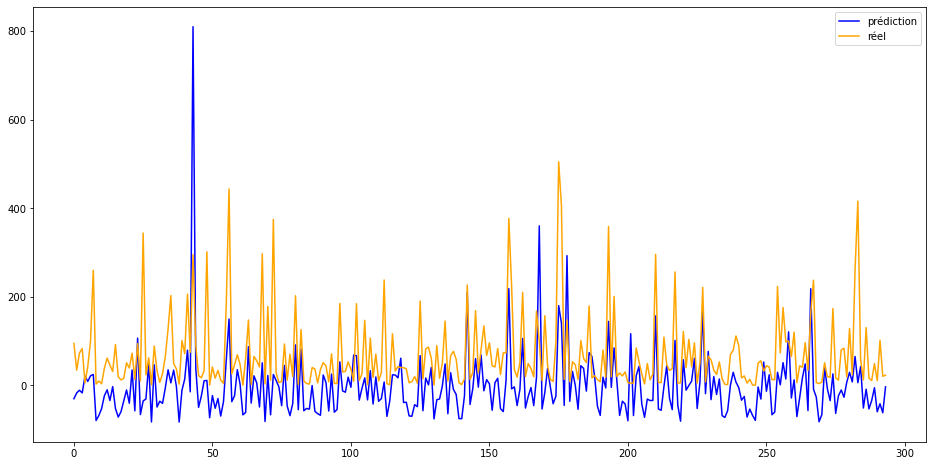

In [89]:
model_df_krr_lin_grid = test_model(X, Y, 0.2, rand_init, 
                                          num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [90]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_krr_lin_grid, 'model_df_krr_lin_grid', model_ln)

### Noyau Gaussien

Temps d'entrainement: 2.4184804000000213
R2 score : 0.4158252628939433
mae : 40.89930811035299


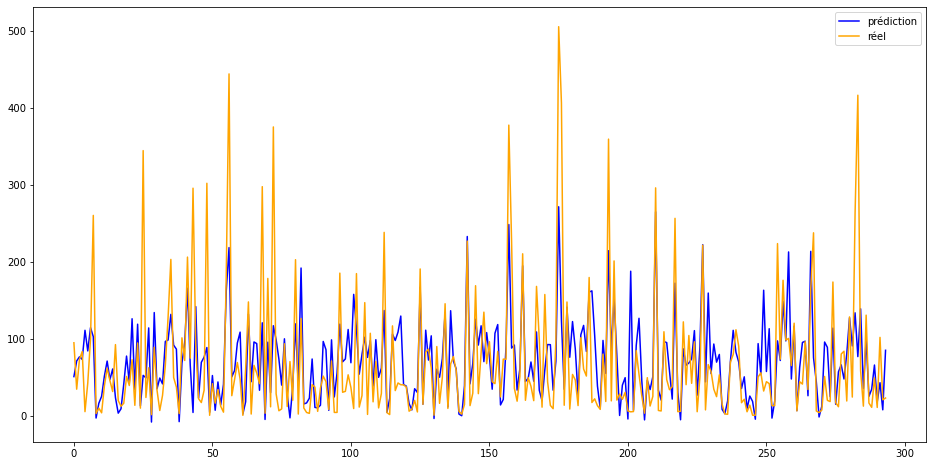

In [91]:
grid_pred = GridSearchCV(
        kernel_ridge.KernelRidge(kernel='rbf'),
        param_grid,
        cv=cv)
model_df_krr_rbf = test_model(X, Y, 0.2, rand_init, 
                                     num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [92]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_krr_rbf, 'model_df_krr_rbf_grid', model_ln)

### Feature importance

In [93]:
model = kernel_ridge.KernelRidge(alpha=1.0, kernel='rbf', gamma=0.01)

model = model.fit(X_train_scaled,Ytrain)

In [94]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

## ElasticNet

In [95]:
# grille d'hyperparamètres
param_grid = {'alpha': [0.01, 0.1, 1], 'l1_ratio' : [0.25, 0.5, 0.75], 'random_state': [0, 5, 10, 20]}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        ElasticNet(),
        param_grid,
        cv=cv)

Temps d'entrainement: 0.1563951999999631
R2 score : 0.28502868948453
mae : 44.00976827591948


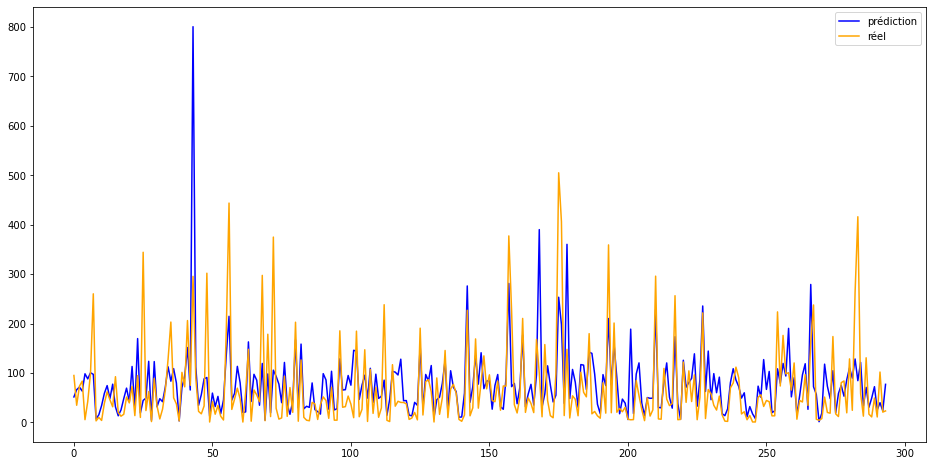

In [96]:
model_df_elasticnet_grid = test_model(X, Y, 0.2, rand_init, 
                                             num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [97]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_elasticnet_grid, 'model_df_elasticnet_grid', model_ln)

### Feature importance

In [98]:
model = ElasticNet(random_state = 5)

model = model.fit(X_train_scaled,Ytrain)

In [99]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

## Gradient boosting

In [100]:
n_estimators_range = [100, 200, 300, 400, 500]

reg_lambda_range = [1, 2]

gamma_range = [0, 1]

max_depth_range = [1, 2, 3, 4]

# grille de paramètres
param_grid = {'n_estimators': n_estimators_range, 'reg_lambda': reg_lambda_range, 'gamma': gamma_range, 'max_depth': max_depth_range}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        xgb.XGBRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 32.55068689999996
R2 score : 0.3634986143630068
mae : 40.36239757202921


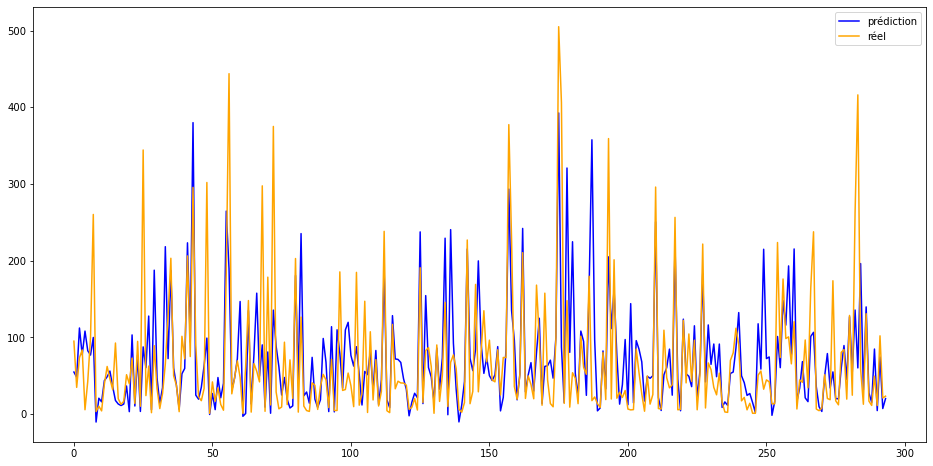

In [101]:
model_df_xgb_grid = test_model(X, Y, 0.2, rand_init, 
                                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [102]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_xgb_grid, 'model_df_xgb_grid', model_ln)

### Feature importance

In [103]:
model = xgb.XGBRegressor(n_estimators=100, reg_lambda=2, gamma=0, max_depth=2)

model = model.fit(X_train_scaled,Ytrain)

In [104]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

# Données: df avec ENERGY STAR Score

In [105]:
X = df[['CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 
       'distance_from_City_Hall', 'education', 'leisure', 'lodging', 'mall',
       'medical', 'non refrigerated warehouse', 'office', 'other',
       'refrigerated warehouse', 'restauration', 'services', 'store','proportion_elec']]

X = X.loc[~(X['ENERGYSTARScore'].isna())]
Y = df['TotalGHGEmissions'].loc[X.index]
Y_ln = df['ln_emissions'].loc[X.index]

In [106]:
# Préprocessing des données pour la fonction test_model
num_encoder = StandardScaler()

var_num_encoder = ['CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 
       'distance_from_City_Hall', 'education', 'leisure', 'lodging', 'mall',
       'medical', 'non refrigerated warehouse', 'office', 'other',
       'refrigerated warehouse', 'restauration', 'services', 'store','proportion_elec']

categ_encoder = OneHotEncoder(handle_unknown='ignore')

var_categ_encoder = []

In [107]:
X_train, X_test, Ytrain, Ytest = train_test_split(X,Y, test_size=0.2, random_state=3)

# Préprocessing des données pour la feature importance locale
ct = make_column_transformer(
    (StandardScaler(),['CouncilDistrictCode', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore',
       'distance_from_City_Hall', 'education', 'leisure', 'lodging', 'mall',
       'medical', 'non refrigerated warehouse', 'office', 'other',
       'refrigerated warehouse', 'restauration', 'services', 'store','proportion_elec']))

ct.fit(X_train)

X_train_scaled = ct.transform(X_train)
X_test_scaled = ct.transform(X_test)

## Random forest

In [108]:
# grille d'hyperparamètres
param_grid = {'n_estimators': [100,200,300,400,500]}

# initialiser la validation croisée
grid_pred = GridSearchCV(
        RandomForestRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 15.33538370000008
R2 score : 0.5373281257603546
mae : 34.1889942268041


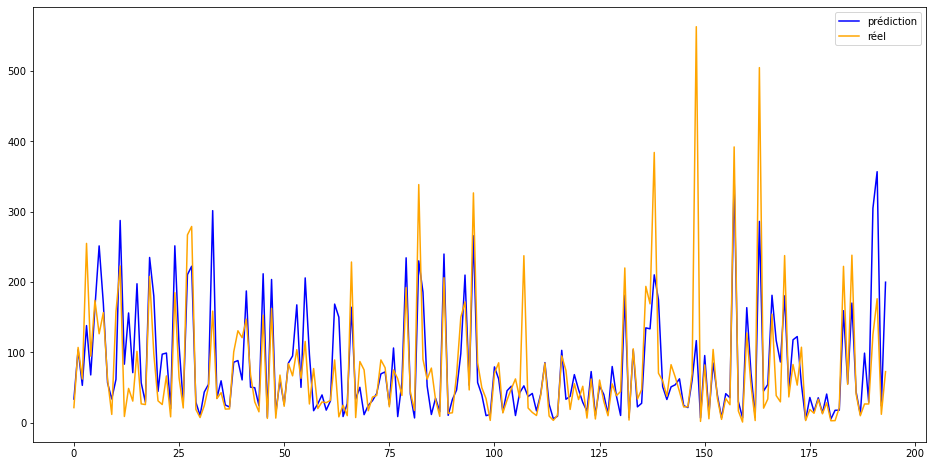

In [109]:
model_df_starscore_forest_grid = test_model(X, Y, 0.2, rand_init, 
                                         num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [110]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_starscore_forest_grid, 'model_df_starscore_forest_grid', model_ln)

### Feature importance

In [111]:
model = RandomForestRegressor(n_estimators=200)
model.fit(X_train_scaled, Ytrain)

RandomForestRegressor(n_estimators=200)

Regardons d'abords la feature importance globale.

<AxesSubplot:>

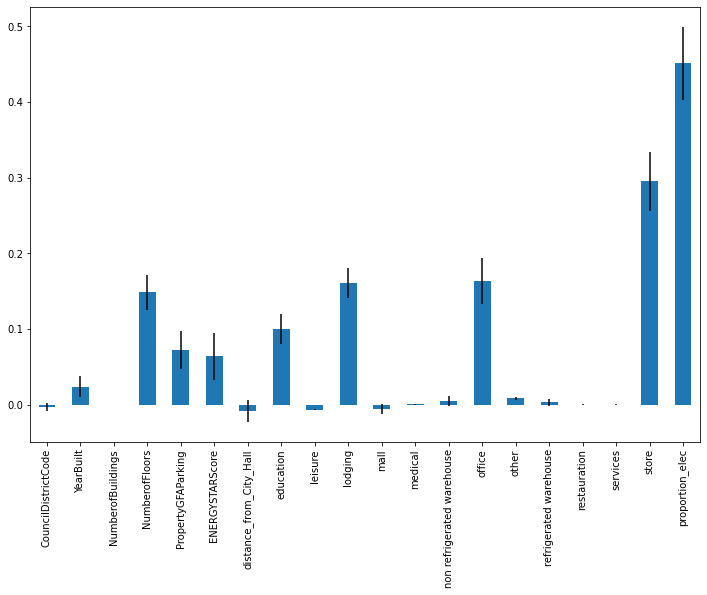

In [112]:
result = permutation_importance(
    model, X_test_scaled, Ytest, n_repeats=10, random_state=42, n_jobs=2
)

forest_importances = pd.Series(result.importances_mean, index=X.columns)
plt.figure(figsize=(12,8))
forest_importances.plot.bar(yerr=result.importances_std)

Puis localement.

In [113]:
X_test.iloc[[num_sample_a, num_sample_b]]

,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,ENERGYSTARScore,distance_from_City_Hall,education,leisure,lodging,mall,medical,non refrigerated warehouse,office,other,refrigerated warehouse,restauration,services,store,proportion_elec
577,2,1971.0,1.0,1.0,0.0,75.0,3.877117,55206.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.62
259,6,1999.0,1.0,3.0,114829.0,96.0,5.128589,0.0,0.0,0.0,0.0,0.0,93893.0,152579.0,0.0,7500.0,0.0,0.0,0.0,0.87


Attention le deuxième bâtiments n'est pas le même que sans l'ENERGY STAR Score.

In [114]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

In [115]:
lime_explanation(model, X_test_scaled, num_sample_b, X.columns.shape[0])

## Kernel Ridge Regression à noyau gaussien

Cette fois-ci nous ne testerons pas de noyau linéaire car les tests effectué jusqu'à présent ont montré qu'il était bien moins performant qu'un noyau gaussien.

Temps d'entrainement: 0.9843673000000308
R2 score : 0.5933333043605165
mae : 33.10100407028374


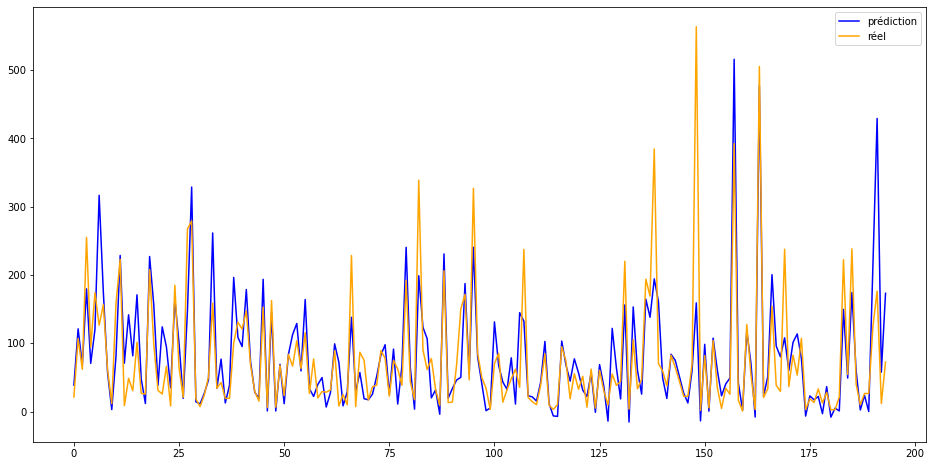

In [116]:
alpha_range = np.logspace(-2, 2, 5)


gamma_range = np.logspace(-2, 1, 4)

# grille d'hyperparamètres
param_grid = {'alpha': alpha_range, 'gamma': gamma_range}

grid_pred = GridSearchCV(
        kernel_ridge.KernelRidge(kernel='rbf'),
        param_grid,
        cv=cv)
model_df_starscore_krr_rbf = test_model(X, Y, 0.2, rand_init, 
                                     num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [117]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_starscore_krr_rbf, 'model_df_starscore_krr_rbf_grid', model_ln)

### Feature importance

In [118]:
model = kernel_ridge.KernelRidge(alpha=1.0, kernel='rbf', gamma=0.01)

model = model.fit(X_train_scaled,Ytrain)

In [119]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

C'est très différent de ce que nous avons obtenu pour les forêts aléatoires.

## ElasticNet

In [120]:
# grille d'hyperparamètres
param_grid = {'alpha': [0.01, 0.1, 1], 'l1_ratio' : [0.25, 0.5, 0.75], 'random_state': [0, 5, 10, 20]}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        ElasticNet(),
        param_grid,
        cv=cv)

Temps d'entrainement: 0.17675180000003365
R2 score : 0.3057533525687568
mae : 42.14312788140867


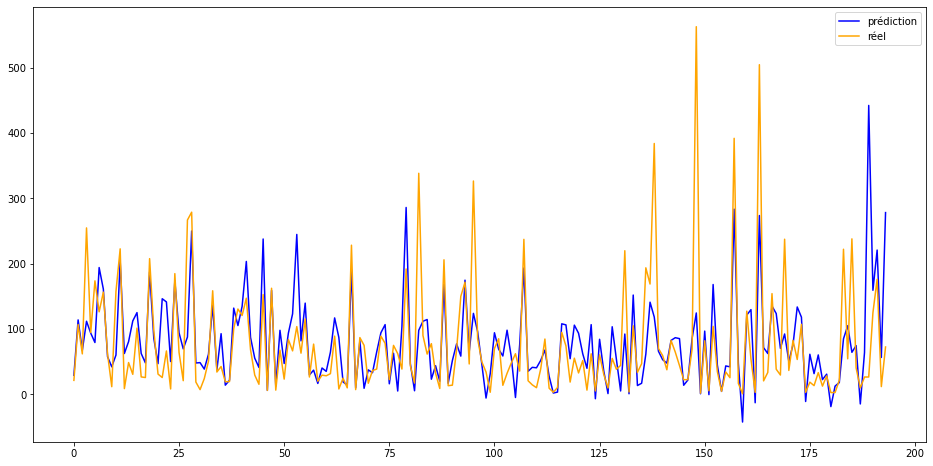

In [121]:
model_df_elasticnet_grid = test_model(X, Y, 0.2, rand_init, 
                                             num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [122]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_elasticnet_grid, 'model_df_starscore_elasticnet_grid', model_ln)

### Feature importance

In [123]:
model = ElasticNet(random_state = 5)

model = model.fit(X_train_scaled,Ytrain)

In [124]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

## Gradient boosting

In [125]:
n_estimators_range = [100, 200, 300, 400, 500]

reg_lambda_range = [1, 2]

gamma_range = [0, 1]

max_depth_range = [1, 2, 3, 4]

# grille d'hyperparamètres
param_grid = {'n_estimators': n_estimators_range, 'reg_lambda': reg_lambda_range, 'gamma': gamma_range, 'max_depth': max_depth_range}


# initialiser la validation croisée
grid_pred = GridSearchCV(
        xgb.XGBRegressor(),
        param_grid,
        cv=cv)

Temps d'entrainement: 29.48743539999998
R2 score : 0.5680221092295641
mae : 34.496716289010244


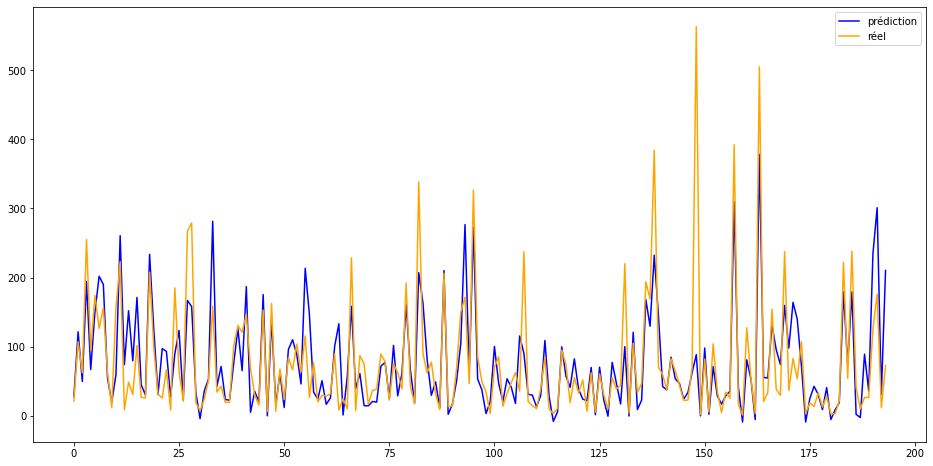

In [126]:
model_df_starscore_xgb_grid = test_model(X, Y, 0.2, rand_init, 
                                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, True)

In [127]:
model_ln = test_model(X, Y_ln, 0.2, rand_init, 
                      num_encoder, var_num_encoder, categ_encoder, var_categ_encoder, grid_pred, False, False)
add_line_to_modeles(mes_modeles, model_df_starscore_xgb_grid, 'model_df_starscore_xgb_grid', model_ln)

### Feature importance

In [128]:
model = xgb.XGBRegressor(n_estimators=100, reg_lambda=2, gamma=0, max_depth=2)

model = model.fit(X_train_scaled,Ytrain)

In [129]:
lime_explanation(model, X_test_scaled, num_sample_a, X.columns.shape[0])

# Choix du modèle

Regardons maintenant le récapitulatif des résultats.

In [130]:
mes_modeles

,modèle,temps d'éxécution,R2_score,mae,temps d'éxécution ln,R2_score ln,mae ln
0,dummy_mean,0.008493,-0.013785,63.041255,0.007638,-0.015452,1.006166
1,dummy_median,0.008210,-0.094465,52.983401,0.007947,-0.026194,1.007961
2,model_forest_grid,65.879831,0.488997,36.510987,64.367547,0.641898,0.561515
3,model_forest,2.444724,0.505763,35.831551,2.247215,0.640213,0.564297
4,model_krr_lin_grid,2.703024,0.352685,46.298480,2.617744,0.508922,0.670767
5,model_krr_lin,0.043793,0.326498,47.125873,0.040171,0.508922,0.670767
6,model_krr_rbf_grid,3.445316,0.465514,41.345933,3.435287,0.562843,0.613034
7,model_krr_rbf,0.050245,0.281736,43.800404,0.049272,0.052514,0.827338
8,model_elasticnet_grid,1.026691,0.348557,46.878329,0.576434,0.509807,0.669735
9,model_elasticnet,0.009710,0.378337,47.484044,0.008804,0.011456,0.990945


Tout d'abord on remarque qu'à quelques exceptions près il est plus efficace de prédire le logarithme des émissions que directement les émissions.

De plus on remarque que la prise en compte l'ENERGY STAR Score améliore la qualité des modèles (sauf dans un cas, le krr linéaire).

Contrairement à la prédiction de la consommation, ici le meilleur modèle dépend des données disponibles: si on ne prends pas en compte l'ENERGY STAR Score alors le meilleur modèle est une forêt aléatoire entraîné sur 'data', mais avec l'ENERGY STAR Score c'est le gradient boosting qui est le meilleur.

Mais n'oublions pas que les résultats dépendent fortement du jeu d'entraînement. Un point d'amélioration envisageable pour cette étude serait d'imposer lors de la validation croisée des proportions de catégories de bâtiments conforme aux proportion dans le jeu de donnée au départ.

Comme il est fastidieux d'obtenir l'ENERGY STAR Score, on recommande d'utiliser un modèle de forêts aléatoires entraîné avec des données de type 'data' et non 'df', afin de prédire 'ln_emissions'.